# Magic Code

In [1]:
!/usr/bin/python3 -m pip install --upgrade pip

In [2]:
!pip install transformers

In [3]:
!pip install torch

In [4]:
!pip install scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 36.2 MB/s eta 0:00:0000:0100:01


In [5]:
!pip install datasets

In [6]:
import defdevice
defdevice.force_device('cuda:2') # Insert the cuda device that you're using.
import metrics
import nns
import immaskdataset
import importlib
import imcapdataset
import embdataset
import embedders
import losses
import imageops
import misc
import segmodel
import torch
import numpy as np
from tensorconversions import tnp
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import gridspec
%matplotlib inline

In [7]:
colorsl = [[255, 0, 0], [0, 255, 0], [0, 0, 255], [255, 255, 0], [255, 0, 255], [0, 255, 255], [0, 0, 0], [255, 255, 255], [128, 128, 128], [128, 0, 0], [0, 128, 0], [0, 0, 128]]
colors = np.array(colorsl)
colorsl = [[c / 255 for c in color] for color in colorsl]

def array_to_rgb(array):
    n, y, x = array.shape
    max_indices = np.argmax(array, axis=0)
    rgb_image = np.zeros((y, x, 3), dtype=np.uint8)
    for i in range(n):
        mask = max_indices == i
        rgb_image[mask] = colors[i]
        
    return rgb_image

In [39]:
image_embr = embedders.M2FImageEmbedder()
text_embr = embedders.CLIPTextEmbedder()
model = nns.Linear(1, 1)

def run_image(path, labels, multilabel = False, aggregation = 'max', rough_labels = None):
    path = path
    img = imageops.open_image(path)
    if multilabel == False:
        hmaps = smodel.forward(img, labels)
    else:
        hmaps = smodel.forward_multilabel(img, labels, aggregation = aggregation)

    fig = plt.figure(figsize=(28, 8))
    
    width = ((len(labels) + 2 + 1) // 2) * 2
    gs = gridspec.GridSpec(2, width, width_ratios=[1, 0.05]*(width // 2))
    
    # Original image
    ax0 = fig.add_subplot(gs[0, 0])
    ax0.imshow(img, aspect = 'auto')
    ax0.set_xticks([])
    ax0.set_yticks([])

    ax1 = fig.add_subplot(gs[0, 2])
    ax1.imshow(array_to_rgb(hmaps), aspect = 'auto')
    ax1.set_xticks([])
    ax1.set_yticks([])
    
    if multilabel:
        if rough_labels is None:
            labels_s = [l[0] for l in labels]
        else:
            labels_s = rough_labels
    else:
        labels_s = labels
    
    legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(colorsl[:len(labels_s)], labels_s)]
    ax1.legend(handles=legend_patches)

    # Individual heatmaps and their colorbars
    for idx, l in enumerate(labels):
        ax = fig.add_subplot(gs[(idx * 2 + 4) // width, (idx*2 + 4) % width])
        cax = fig.add_subplot(gs[(idx * 2 + 5) // width, (idx*2 + 5) % width])
        pos = cax.get_position()
        new_pos = [pos.x0 - 0.01, pos.y0, pos.width, pos.height]
        cax.set_position(new_pos)
        ax.set_xticks([])
        ax.set_yticks([])
        
        im = ax.imshow(hmaps[idx], aspect = 'auto', vmin = 0, vmax = 1)
        plt.colorbar(im, cax=cax, pad = 0)
        ax.set_title(labels_s[idx])

    plt.savefig(path[:-4] + 'output' + '.png', bbox_inches = 'tight')

# Demo

In [44]:
model.load("CSRUGDFineTuned")
smodel = segmodel.CSModel(image_embr, text_embr, model)

file_list = ['./FP/fp01.jpeg', './FP/fp05.jpeg', './FP/fp06.jpeg', './FP/fp13.jpeg'] #Images to run model on.
labels = ['void,sky,sign', 
          'concrete,asphalt', 
          'gravel,grass,dirt,sand,mulch', 
          'rock,rock-bed', 
          'water', 
          'tree,pole,vehicle,container/generic-object,building,log,bicycle,person,fence,bush,picnic-table,bridge']
labels = [st.split(',') for st in labels]

rough_labels = ['background', 'smooth terrain', 'rough terrain', 'bumpy terrain', 'forbidden terrain', 'obstacle']

for path in file_list:
    run_image(path, labels, multilabel = True, aggregation = 'hello', rough_labels = rough_labels)

ValueError: Aggregation hello not recognized

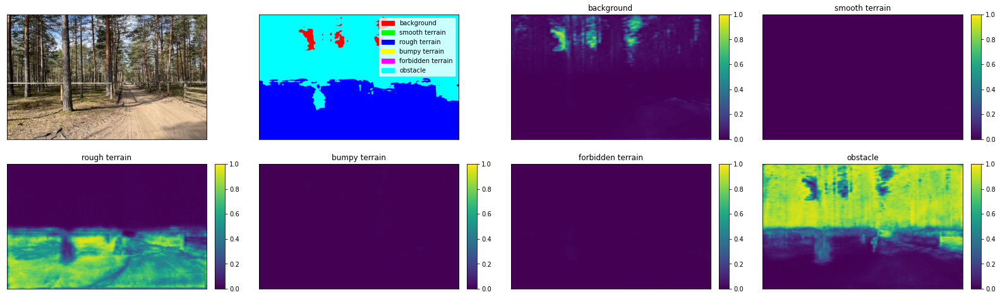

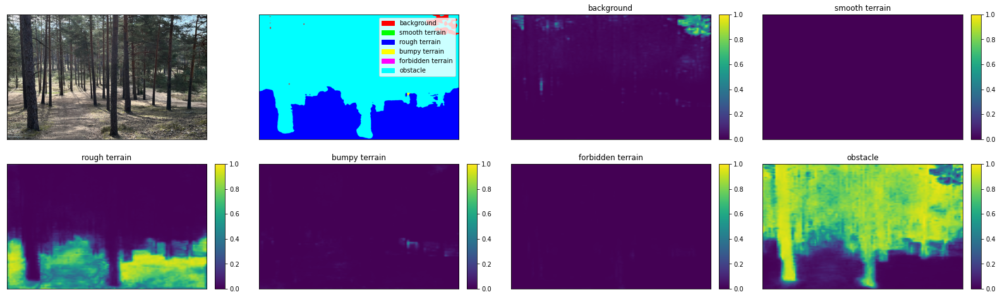

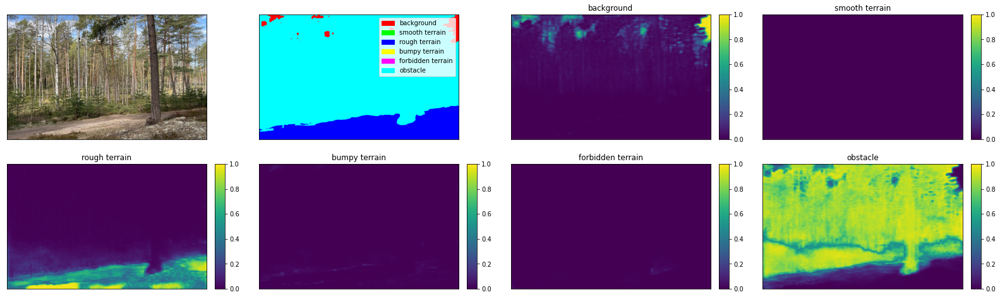

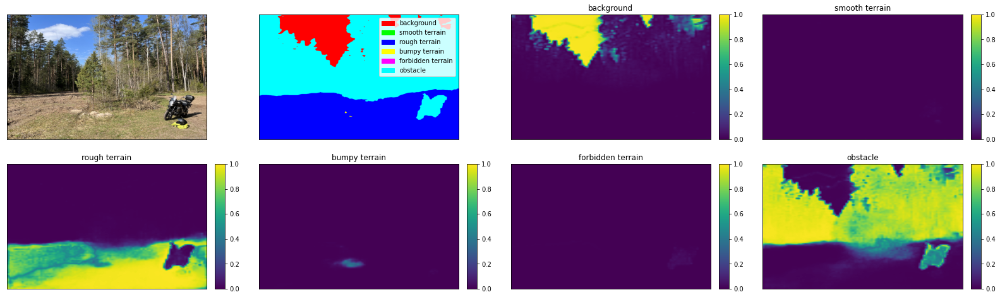

In [43]:
model.load("CSRUGDFineTuned")
smodel = segmodel.CSModel(image_embr, text_embr, model)

file_list = ['./FP/fp01.jpeg', './FP/fp05.jpeg', './FP/fp06.jpeg', './FP/fp13.jpeg'] #Images to run model on.
labels = ['void,sky,sign', 
          'concrete,asphalt', 
          'gravel,grass,dirt,sand,mulch', 
          'rock,rock-bed', 
          'water', 
          'tree,pole,vehicle,container/generic-object,building,log,bicycle,person,fence,bush,picnic-table,bridge']
labels = [st.split(',') for st in labels]

rough_labels = ['background', 'smooth terrain', 'rough terrain', 'bumpy terrain', 'forbidden terrain', 'obstacle']

for path in file_list:
    run_image(path, labels, multilabel = True, aggregation = 'max', rough_labels = rough_labels)

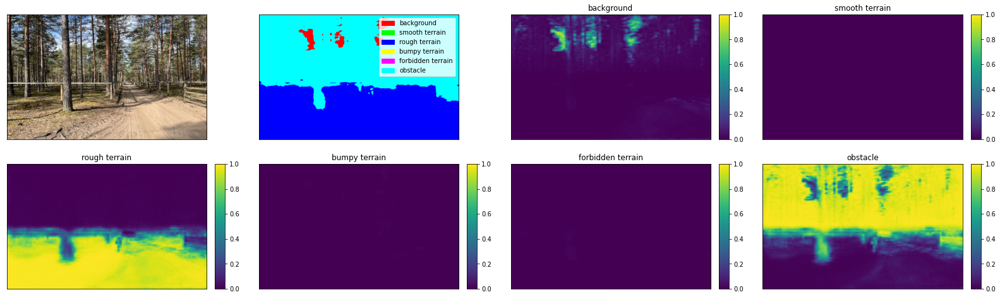

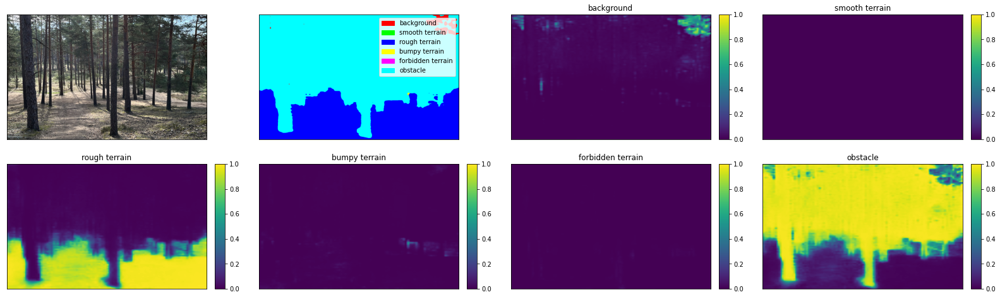

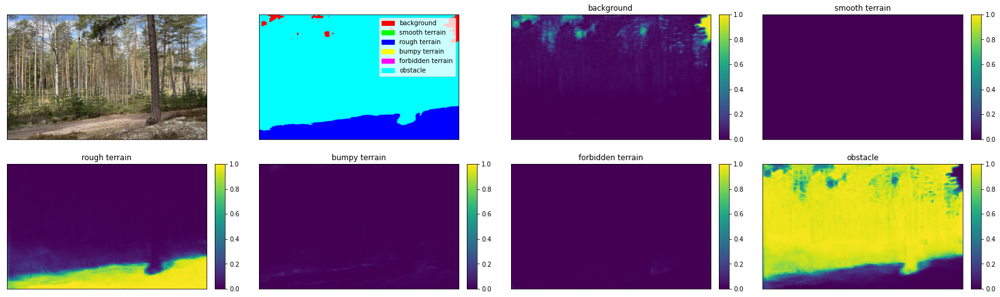

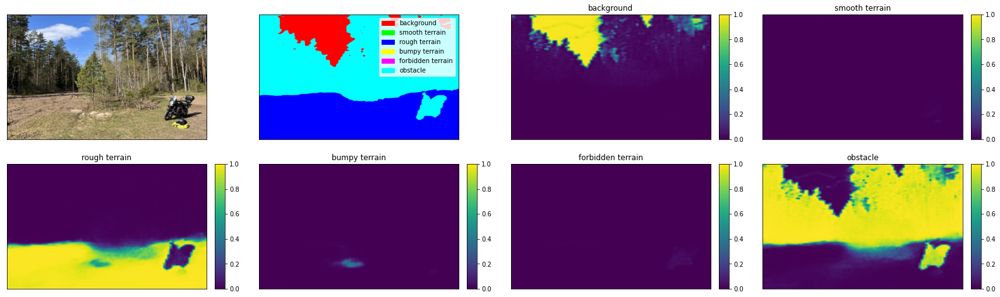

In [42]:
model.load("CSRUGDFineTuned")
smodel = segmodel.CSModel(image_embr, text_embr, model)

file_list = ['./FP/fp01.jpeg', './FP/fp05.jpeg', './FP/fp06.jpeg', './FP/fp13.jpeg'] #Images to run model on.
labels = ['void,sky,sign', 
          'concrete,asphalt', 
          'gravel,grass,dirt,sand,mulch', 
          'rock,rock-bed', 
          'water', 
          'tree,pole,vehicle,container/generic-object,building,log,bicycle,person,fence,bush,picnic-table,bridge']
labels = [st.split(',') for st in labels]

rough_labels = ['background', 'smooth terrain', 'rough terrain', 'bumpy terrain', 'forbidden terrain', 'obstacle']

for path in file_list:
    run_image(path, labels, multilabel = True, aggregation = 'sum', rough_labels = rough_labels)

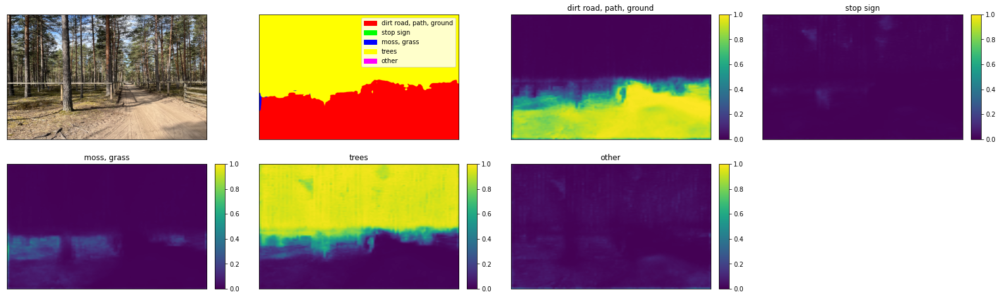

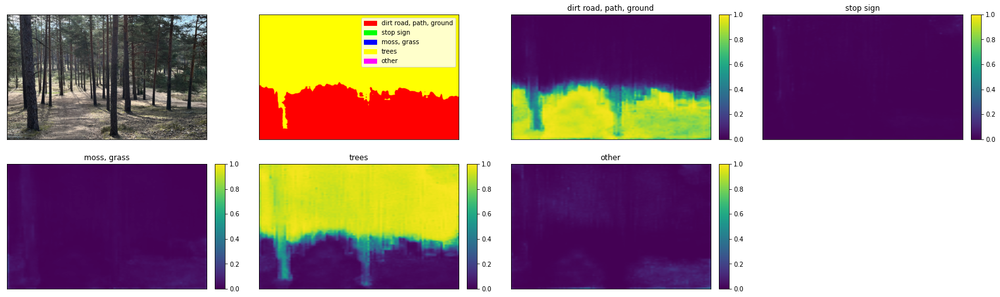

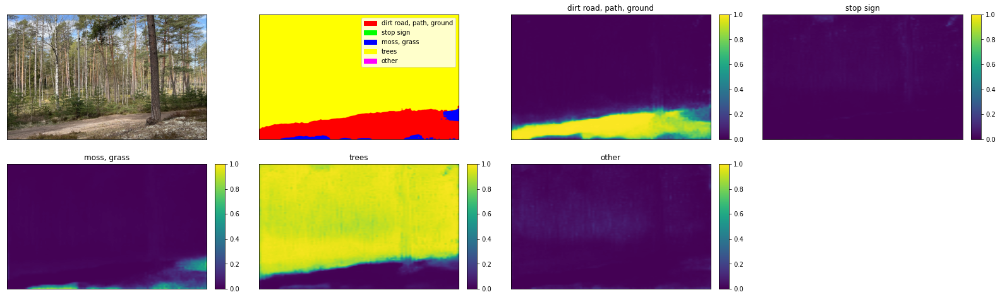

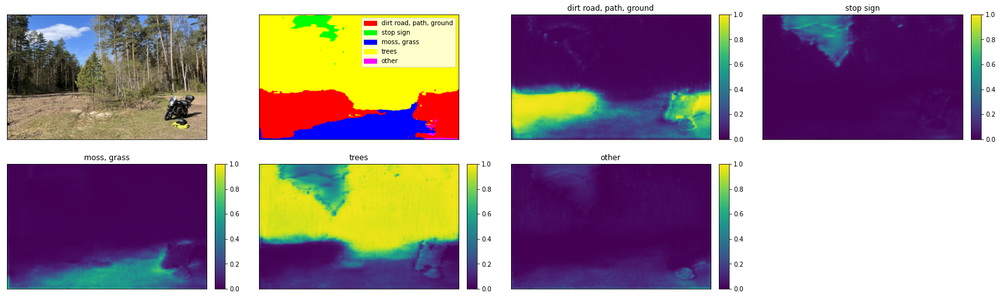

In [41]:
model.load("CSTableModel")
smodel = segmodel.CSModel(image_embr, text_embr, model)

file_list = ['./FP/fp01.jpeg', './FP/fp05.jpeg', './FP/fp06.jpeg', './FP/fp13.jpeg'] #Images to run model on.
labels = ['dirt road, path, ground', 'stop sign', 'moss, grass', 'trees', 'other'] #Labels to look for.

#- dirt road, path
#- moss, grass
#- trees
#- other

for path in file_list:
    run_image(path, labels)

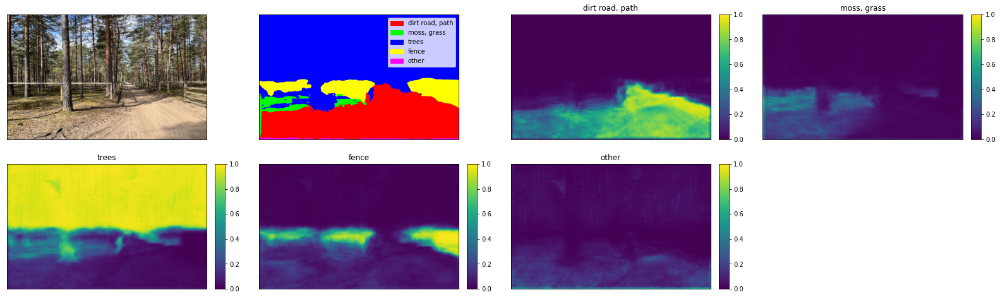

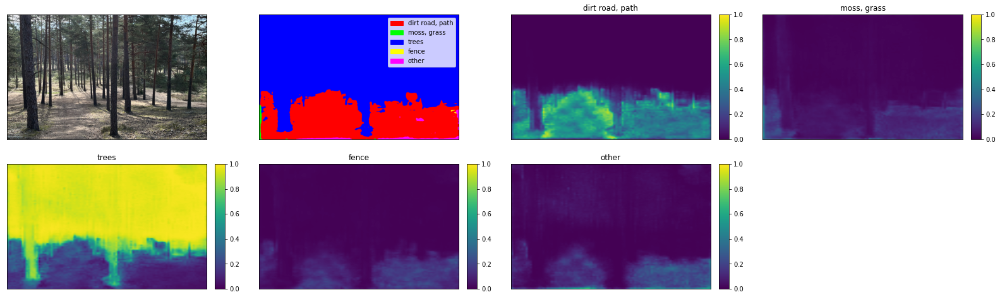

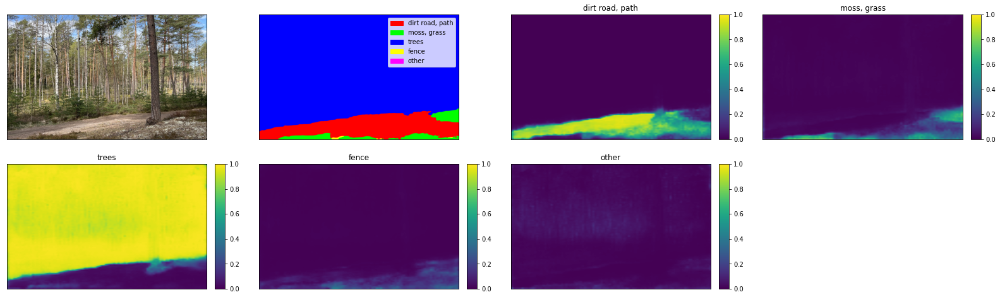

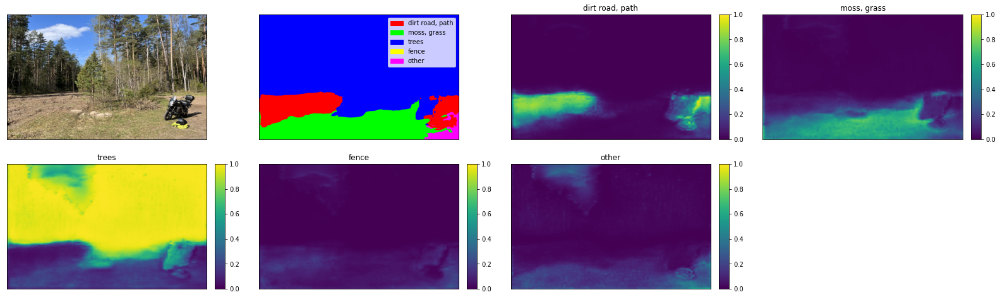

In [15]:
file_list = ['./FP/fp01.jpeg', './FP/fp05.jpeg', './FP/fp06.jpeg', './FP/fp13.jpeg'] #Images to run model on.
labels = ['dirt road, path', 'moss, grass', 'trees', 'fence', 'other'] #Labels to look for.

#- dirt road, path
#- moss, grass
#- trees
#- other

for path in file_list:
    run_image(path, labels)

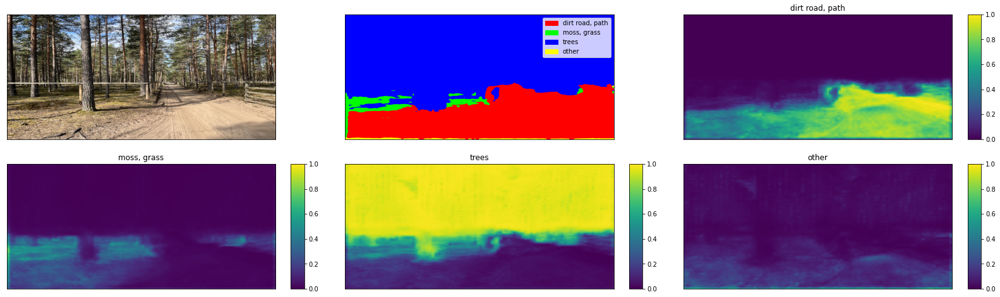

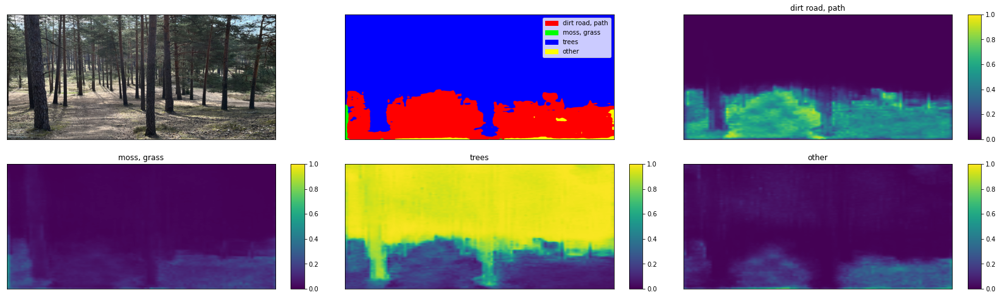

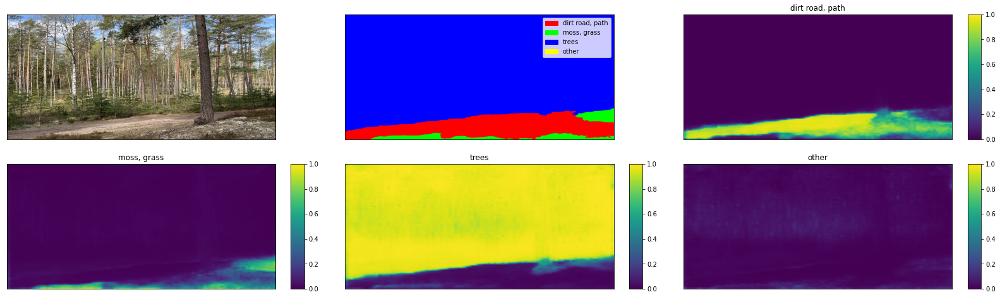

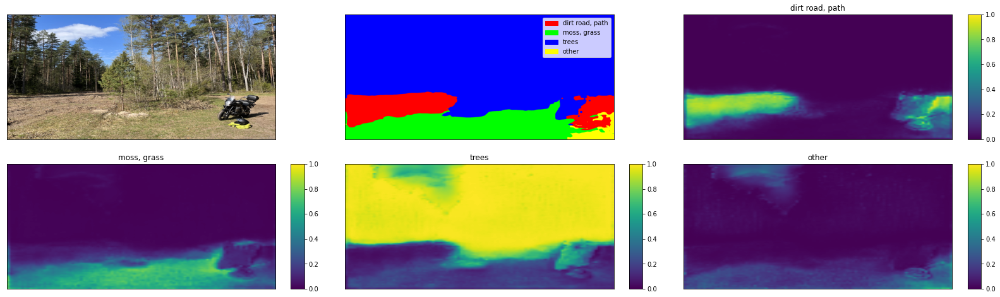

In [16]:
file_list = ['./FP/fp01.jpeg', './FP/fp05.jpeg', './FP/fp06.jpeg', './FP/fp13.jpeg'] #Images to run model on.
labels = ['dirt road, path', 'moss, grass', 'trees', 'other'] #Labels to look for.

#- dirt road, path
#- moss, grass
#- trees
#- other

for path in file_list:
    run_image(path, labels)

In [ ]:
file_list = ['./RoboPhoto/1.jpg', './RoboPhoto/2.jpg', './RoboPhoto/3.jpg', './RoboPhoto/4.jpg'] #Images to run model on.
labels = ['roomba / metal box / warehouse robot', 'warehouse shelf', 'cardboard box', 'floor', 'ceiling', 'other'] #Labels to look for.

for path in file_list:
    run_image(path, labels)

In [ ]:
file_list = ['./RoboPhoto/1.jpg', './RoboPhoto/2.jpg'] #Images to run model on.
labels = ['robot roomba / metal box', 'shelf', 'cardboard box', 'floor', 'display', 'other'] #Labels to look for.

for path in file_list:
    run_image(path, labels)

In [ ]:
file_list = ['./RoboPhoto/1.jpg', './RoboPhoto/2.jpg', './RoboPhoto/3.jpg', './RoboPhoto/4.jpg'] #Images to run model on.
labels = ['roomba / metal box / warehouse robot', 'warehouse shelf', 'cardboard box', 'floor', 'display', 'other'] #Labels to look for.

for path in file_list:
    run_image(path, labels)

In [ ]:
file_list = ['./RoboPhoto/1.jpg', './RoboPhoto/2.jpg', './RoboPhoto/3.jpg', './RoboPhoto/4.jpg'] #Images to run model on.
labels = ['roomba / metal box / warehouse robot', 'warehouse shelf', 'cardboard box', 'floor', 'ceiling', 'other'] #Labels to look for.

for path in file_list:
    run_image(path, labels)

In [ ]:
file_list = ['./45.png', './RoboPhoto/1.jpg'] #Images to run model on.
labels = ['pavement / smooth terrain', 'rough terrain', 'obstacle', 'sky'] #Labels to look for.

for path in file_list:
    run_image(path, labels)

In [ ]:
#file_list = ['./45.png', './RoboPhoto/1.jpg'] #Images to run model on.
file_list = [
'./GuntisBildes/creek_00011.png',
'./GuntisBildes/creek_00371.png',
'./GuntisBildes/creek_00821.png'
] #Images to run model on.

labels = ['pavement / smooth terrain', 'rough terrain', 'obstacle', 'sky'] #Labels to look for.

for path in file_list:
    run_image(path, labels)

In [ ]:
#file_list = ['./45.png', './RoboPhoto/1.jpg'] #Images to run model on.
file_list = [
'./GuntisBildes/creek_00011.png',
'./GuntisBildes/creek_00371.png',
'./GuntisBildes/creek_00821.png',
'./GuntisBildes/creek_00926.png',
'./GuntisBildes/creek_01376.png',
'./GuntisBildes/creek_02416.png',
'./GuntisBildes/creek_03251.png',
'./GuntisBildes/creek_04006.png',
'./GuntisBildes/park-1_00031.png',
'./GuntisBildes/village_00003.png',
    
'./GuntisBildes/village_00058.png',
'./GuntisBildes/village_00078.png',
'./GuntisBildes/village_00133.png',
'./GuntisBildes/village_00363.png'
] #Images to run model on.

labels = ['pavement / smooth terrain', 'rough terrain', 'obstacle', 'sky'] #Labels to look for.

for path in file_list:
    run_image(path, labels)

In [ ]:
#file_list = ['./45.png', './RoboPhoto/1.jpg'] #Images to run model on.
file_list = [
'./GuntisBildes/creek_00011.png',
'./GuntisBildes/creek_00371.png',
'./GuntisBildes/creek_00821.png',
'./GuntisBildes/creek_00926.png',
'./GuntisBildes/creek_01376.png',
'./GuntisBildes/creek_02416.png',
'./GuntisBildes/creek_03251.png',
'./GuntisBildes/creek_04006.png',
'./GuntisBildes/park-1_00031.png',
'./GuntisBildes/village_00003.png', 
'./GuntisBildes/village_00058.png',
'./GuntisBildes/village_00078.png',
'./GuntisBildes/village_00133.png',
'./GuntisBildes/village_00363.png'
] #Images to run model on.

#labels = ['pavement / smooth terrain', 'rough terrain', 'obstacle', 'sky'] #Labels to look for.

#labels = ['background', 'smooth terrain', 'rough terrain', 'bumby terrain', 'forbidden terrain', 'obstacle'] #Labels to look for.

labels = ['Background: Void, Sky, Sign', 'smooth terrain: Concrete, Asphalt', 'rough terrain: Gravel, Grass, Dirt, Sand', 'bumby terrain: Rock, Rock Bed', 'forbidden terrain: Water, Bushes, Tall Vegetation', 'obstacle: Trees, Poles, Logs, etc.'] #Labels to look for.


for path in file_list:
    run_image(path, labels)

In [ ]:
#file_list = ['./45.png', './RoboPhoto/1.jpg'] #Images to run model on.
file_list = [
'./GuntisBildes/creek_00011.png',
'./GuntisBildes/creek_00371.png',
'./GuntisBildes/creek_00821.png',
'./GuntisBildes/creek_00926.png',
'./GuntisBildes/creek_01376.png',
'./GuntisBildes/creek_02416.png',
'./GuntisBildes/creek_03251.png',
'./GuntisBildes/creek_04006.png',
'./GuntisBildes/park-1_00031.png',
'./GuntisBildes/village_00003.png', 
'./GuntisBildes/village_00058.png',
'./GuntisBildes/village_00078.png',
'./GuntisBildes/village_00133.png',
'./GuntisBildes/village_00363.png'
] #Images to run model on.

#labels = ['pavement / smooth terrain', 'rough terrain', 'obstacle', 'sky'] #Labels to look for.

#labels = ['background', 'smooth terrain', 'rough terrain', 'bumby terrain', 'forbidden terrain', 'obstacle'] #Labels to look for.

labels = ['Background: Void, Sky, Sign', 'smooth terrain: Asphalt, Pavement', 'rough terrain: Gravel, Grass, Dirt, Sand', 'bumby terrain: Rock, Rock Bed', 'forbidden terrain: Water, Bushes, Tall Vegetation', 'obstacle: Trees, Poles, Logs, etc.'] #Labels to look for.


for path in file_list:
    run_image(path, labels)

In [ ]:
file_list = ['./GuntisBildes/mocis.jpg','./GuntisBildes/zogs.jpg'] #Images to run model on.
labels = ['motorcycle', 'path, dirt road', 'trees', 'sky', 'grass'] #Labels to look for.

for path in file_list:
    run_image(path, labels)

In [ ]:
file_list = ['./GuntisBildes/mocis.jpg','./GuntisBildes/zogs.jpg'] #Images to run model on.
labels = ['fence', 'dirt road', 'trees', 'grass, moss', 'electricity pole'] #Labels to look for.

for path in file_list:
    run_image(path, labels)